In [226]:
# data manuipulation
import numpy as np
import pandas as pd

# modeling utilities
import scipy.stats as stats
from sklearn import metrics
from sklearn import preprocessing
from sklearn import  linear_model
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_predict

import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.tools.tools import add_constant
from  sklearn import model_selection

import pydotplus
import graphviz
from sklearn.tree import export_graphviz
from sklearn import tree
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import mean_squared_error
import itertools
import time


# plotting libraries
import matplotlib.pyplot as plt
import seaborn as sn
from pandas.plotting import scatter_matrix

%matplotlib inline
## denote the working directory
%cd /Users/cyliai/RMBI3110_Assignment1

/Users/cyliai/RMBI3110_Assignment1


In [227]:
df = pd.read_csv('HousePrice.csv')

In [228]:
get_ipython().magic('matplotlib inline')
sn.set_style('whitegrid')
sn.set_context('talk')
params = {'legend.fontsize': 'x-large',
          'figure.figsize': (30, 10),
          'axes.labelsize': 'x-large',
          'axes.titlesize':'x-large',
          'xtick.labelsize':'x-large',
          'ytick.labelsize':'x-large'}
plt.rcParams.update(params)

In [229]:
def centering(df_col):
    S_YrSoldA = []
    for each in df_col:
        S_YrSold = each - df_col.mean()
        S_YrSoldA.append(S_YrSold)
    S_YrSoldA
    return S_YrSoldA

In [230]:
def standi(df_col):
    S_LotArea = []
    mini = df_col.min()
    maxx = df_col.max()
    for each in df_col:
        k = (each-mini)/(maxx-mini)
        S_LotArea.append(k)
    return S_LotArea

In [231]:
## date time conversion
#df['datetime'] = pd.to_datetime(df.datetime)
## categorical variables 
df['MSZoning'] =df.MSZoning.astype('category')
df['Street'] = df.Street.astype('category') 
df['Alley'] = df.Alley.astype('category') 
df['LotShape'] = df.LotShape.astype('category')
df['LandContour'] = df.LandContour.astype('category') 
df['LotConfig'] = df.LotConfig.astype('category')
df['LandSlope'] = df.LandSlope.astype('category')  
df['Neighborhood'] = df.Neighborhood.astype('category')
df['Condition1'] =df.Condition1.astype('category')
df['Condition2'] = df.Condition2.astype('category') 
df['BldgType'] = df.BldgType.astype('category') 
df['HouseStyle'] = df.HouseStyle.astype('category')
df['RoofStyle'] = df.RoofStyle.astype('category') 
df['RoofMatl'] = df.RoofMatl.astype('category')
df['Exterior1st'] = df.Exterior1st.astype('category')  
df['Exterior2nd'] = df.Exterior2nd.astype('category')
df['MasVnrType'] =df.MasVnrType.astype('category')
df['ExterQual'] = df.ExterQual.astype('category') 
df['ExterCond'] = df.ExterCond.astype('category') 
df['Foundation'] = df.Foundation.astype('category')
df['BsmtQual'] = df.BsmtQual.astype('category') 
df['BsmtCond'] = df.BsmtCond.astype('category')
df['BsmtExposure'] = df.BsmtExposure.astype('category')  
df['BsmtFinType1'] = df.BsmtFinType1.astype('category')
df['BsmtFinType2'] =df.BsmtFinType2.astype('category')
df['Heating'] = df.Heating.astype('category') 
df['HeatingQC'] = df.HeatingQC.astype('category') 
df['Electrical'] = df.Electrical.astype('category')
df['KitchenQual'] = df.KitchenQual.astype('category') 
df['Functional'] = df.Functional.astype('category')
df['GarageType'] = df.GarageType.astype('category')  
df['GarageFinish'] = df.GarageFinish.astype('category')
df['GarageQual'] = df.GarageQual.astype('category') 
df['GarageCond'] = df.GarageCond.astype('category')
df['PavedDrive'] = df.PavedDrive.astype('category') 
df['PoolQC'] = df.PoolQC.astype('category')
df['Fence'] = df.Fence.astype('category')  
df['MiscFeature'] = df.MiscFeature.astype('category')
df['SaleType'] = df.SaleType.astype('category')  
df['SaleCondition'] = df.SaleCondition.astype('category')
df['MoSold'] = df.MoSold.astype('category') 

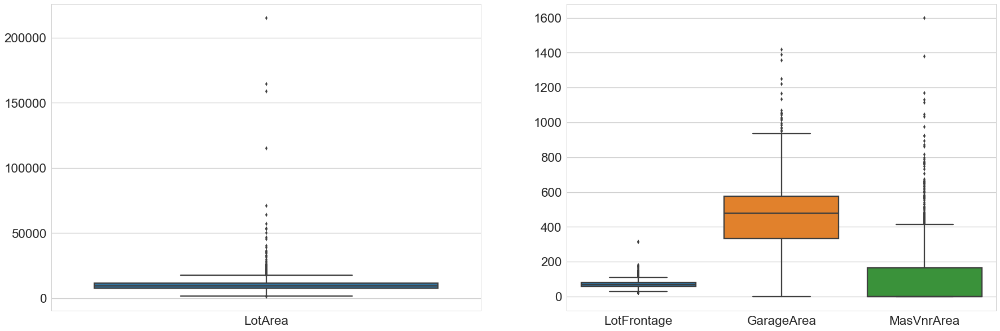

In [232]:
fig,(ax1,ax2)= plt.subplots(ncols=2)
sn.boxplot(data=df[['LotArea']],ax=ax1)
sn.boxplot(data=df[['LotFrontage','GarageArea','MasVnrArea']],ax=ax2)

[Text(0.5,1,'Year-wise Monthly Sales distribution of Sale Price')]

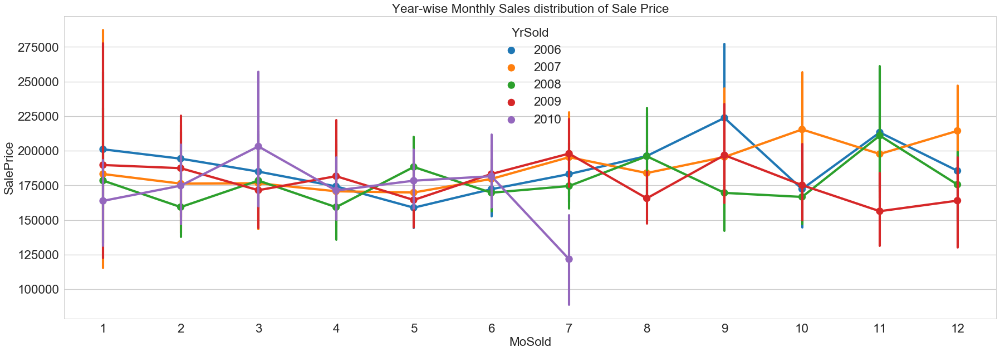

In [233]:
fig,ax = plt.subplots()
sn.pointplot(data=df[['YrSold',
                      'SalePrice',
                      'MoSold']],
             x='MoSold',y='SalePrice',
             hue='YrSold',ax=ax)
ax.set(title="Year-wise Monthly Sales distribution of Sale Price")

[Text(0.5,1,'Neighborhood-wise ridership distribution')]

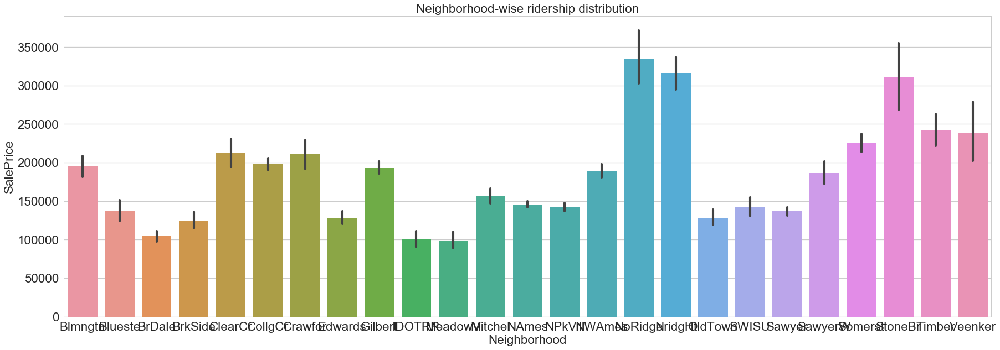

In [234]:
## Month-wise ridership distribution 
## seaborn’s barplot()
fig,ax = plt.subplots()
sn.barplot(data=df[['Neighborhood',
                    'SalePrice']],
           x="Neighborhood",y="SalePrice")
ax.set(title="Neighborhood-wise ridership distribution")

[Text(0.5,1,'YearBuilt-wise ridership distribution')]

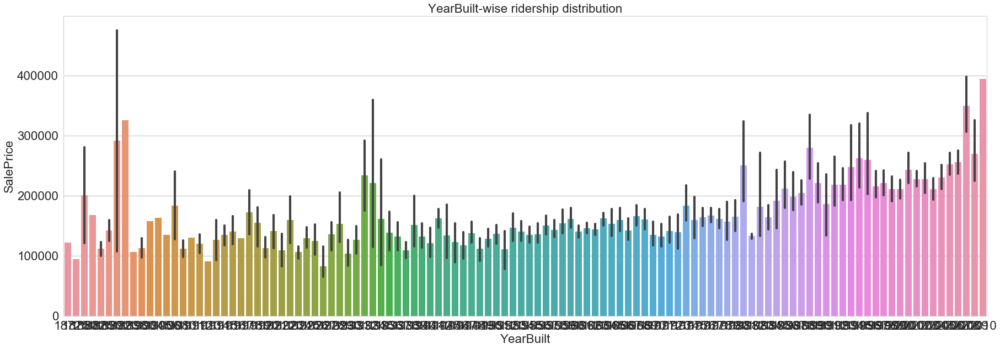

In [235]:
## YearBuilt-wise ridership distribution 
## seaborn’s barplot()
fig,ax = plt.subplots()
sn.barplot(data=df[['YearBuilt',
                    'SalePrice']],
           x="YearBuilt",y="SalePrice")
ax.set(title="YearBuilt-wise ridership distribution")

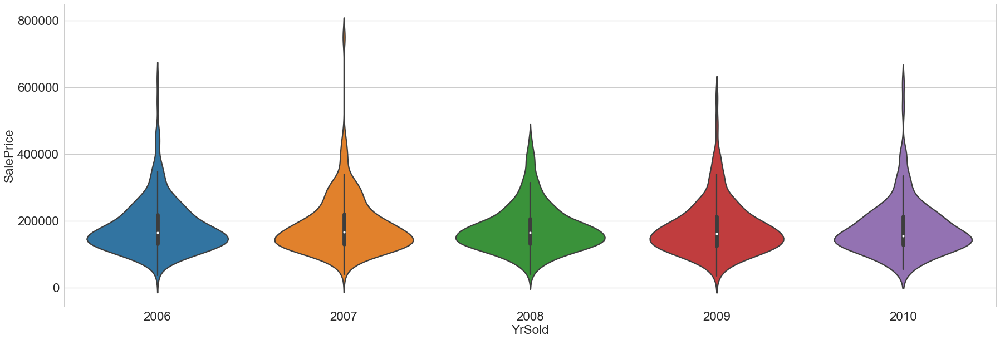

In [236]:
## Violin plot showcasing year-wise ridership distribution
sn.violinplot(data=df[['YrSold',
                       'SalePrice']],
              x="YrSold",y="SalePrice")

In [237]:
print("mean:",df['SalePrice'].mean())
print("mode:",df['SalePrice'].mode())
print("median:",df['SalePrice'].median())
print("SD:",df['SalePrice'].std())

mean: 180921.19589041095
mode: 0    140000
dtype: int64
median: 163000.0
SD: 79442.50288288663


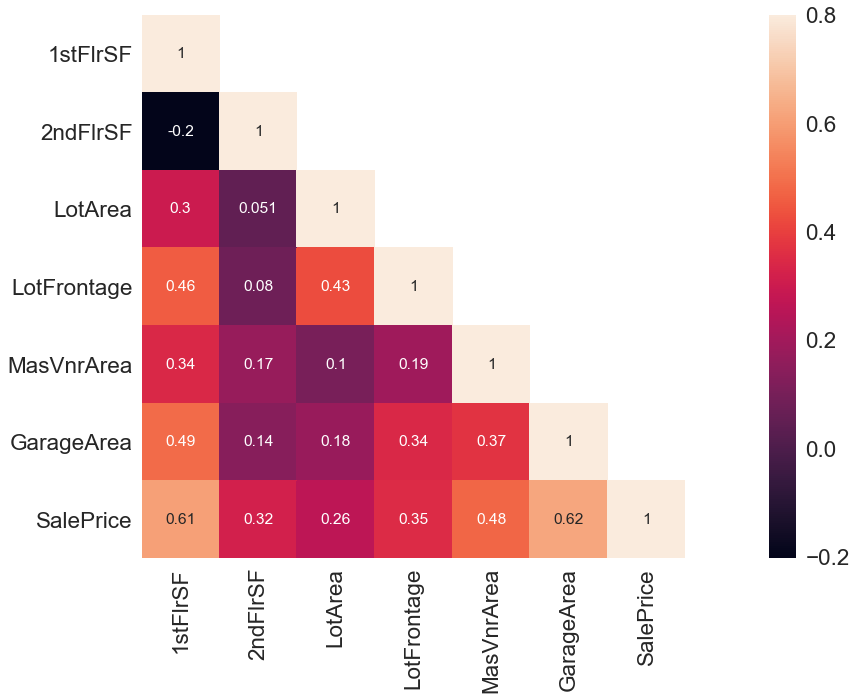

In [238]:
## Correlation matrix between the predictors - correlational matrix (heat map)
corrMatt = df[["1stFlrSF","2ndFlrSF",
               "LotArea","LotFrontage",
               "MasVnrArea","GarageArea", 
               "SalePrice"]].corr()
mask = np.array(corrMatt)
mask[np.tril_indices_from(mask)] = False
sn.heatmap(corrMatt, mask=mask,vmax=.8, square=True,annot=True)

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x1c376898d0>,
      dtype=object)

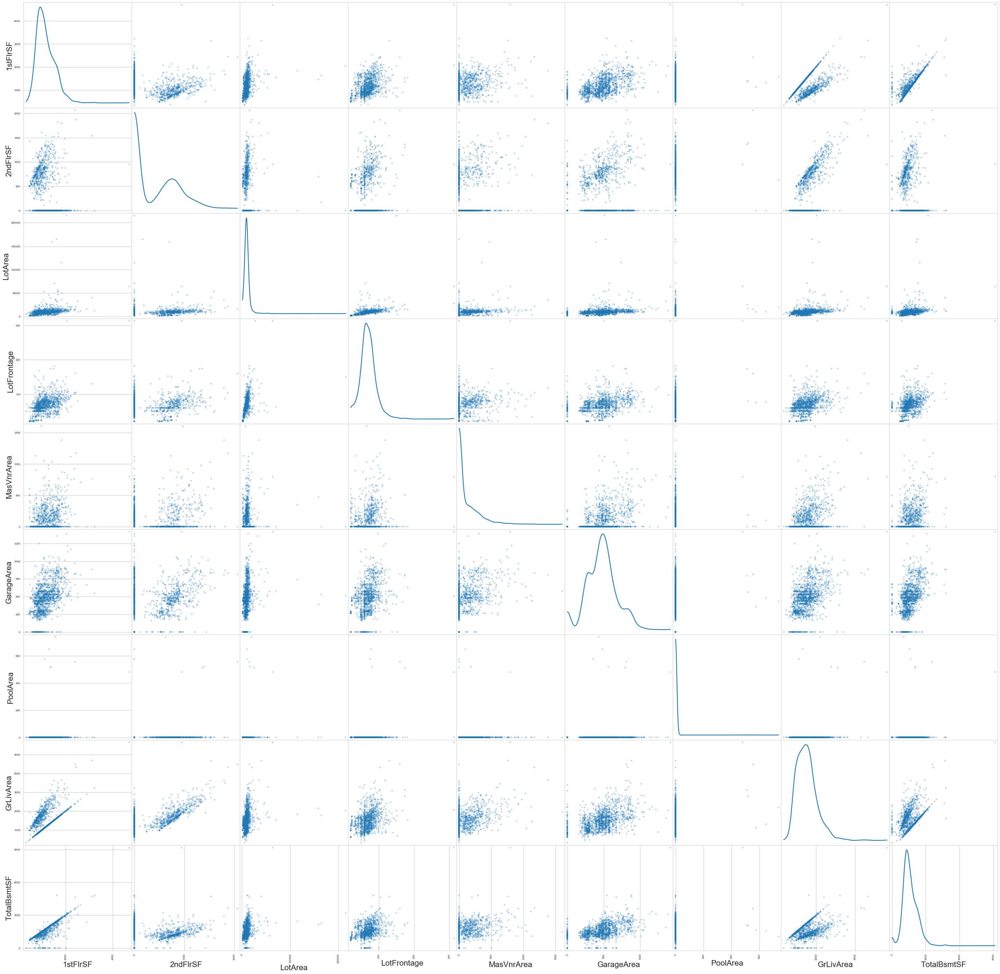

In [239]:
## Scatter matrix between the continuous predictors
scatter_matrix(df[["1stFlrSF","2ndFlrSF",
               "LotArea","LotFrontage",
               "MasVnrArea","GarageArea",
                "PoolArea", "GrLivArea",
               "TotalBsmtSF"]], diagonal='kde', alpha=0.3,figsize=(50,50))

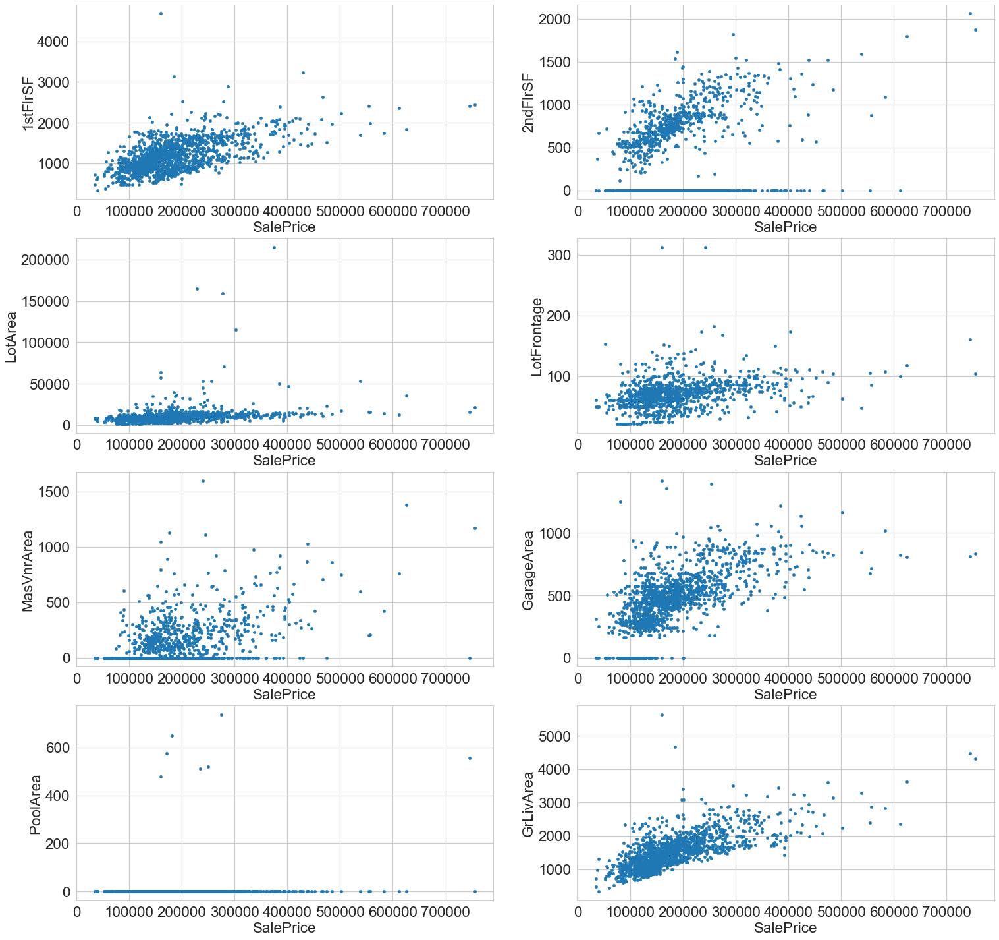

In [240]:
## Area Related Factors vs Sales Price - Scatter plot
fig, ((ax1, ax2),(ax3, ax4),(ax5, ax6),(ax7, ax8)) = plt.subplots(nrows=4, ncols=2,figsize=(25,25))

df.plot(kind='scatter',x='SalePrice',y='1stFlrSF',ax=ax1)
df.plot(kind='scatter',x='SalePrice',y='2ndFlrSF',ax=ax2)
df.plot(kind='scatter',x='SalePrice',y='LotArea',ax=ax3)
df.plot(kind='scatter',x='SalePrice',y='LotFrontage',ax=ax4)
df.plot(kind='scatter',x='SalePrice',y='MasVnrArea',ax=ax5)
df.plot(kind='scatter',x='SalePrice',y='GarageArea',ax=ax6)
df.plot(kind='scatter',x='SalePrice',y='PoolArea',ax=ax7)
df.plot(kind='scatter',x='SalePrice',y='GrLivArea',ax=ax8)

In [241]:
#Data Cleansing

#clean by replacing value by its mean
dfr = df['LotFrontage'].replace(np.nan,df['LotFrontage'].mean())
df['LotFrontage'] = dfr

#Data with meaning, replace nan by meaningful data
dfqc = df['PoolQC'].replace(np.nan,"NoPool")
df['PoolQC'] = dfqc

dff = df['Fence'].replace(np.nan,"NoFence")
df['Fence'] = dff

dfmf = df['MiscFeature'].replace(np.nan,"NoMiscFeature")
df['MiscFeature'] = dfmf

dfgyb = df['GarageYrBlt'].replace(np.nan,-df['GarageYrBlt'].mean())
df['GarageYrBlt'] = dfgyb

dfmva = df['MasVnrArea'].replace(np.nan,-df['MasVnrArea'].mean())
df['MasVnrArea'] = dfmva

dfalley = df['Alley'].replace(np.nan,"NoAlleyAccess")
df['Alley'] = dfalley

dffpq = df['FireplaceQu'].replace(np.nan,"NoFirePlace")
df['FireplaceQu'] = dffpq

dfbq = df['BsmtQual'].replace(np.nan,"NoBasement")
df['BsmtQual'] = dfbq

dfbc = df['BsmtCond'].replace(np.nan,"NoBasement")
df['BsmtCond'] = dfbc

dfbex = df['BsmtExposure'].replace(np.nan,"NoBasement")
df['BsmtExposure'] = dfbex

dfbft1 = df['BsmtFinType1'].replace(np.nan,"NoBasement")
df['BsmtFinType1'] = dfbft1

dfgt = df['GarageType'].replace(np.nan,"NoGarge")
df['GarageType'] = dfgt

dfgf = df['GarageFinish'].replace(np.nan,"NoGarge")
df['GarageFinish'] = dfgf

dfgq = df['GarageQual'].replace(np.nan,"NoGarge")
df['GarageQual'] = dfgq

dfgc = df['GarageCond'].replace(np.nan,"NoGarge")
df['GarageCond'] = dfgc

dfmm = df['MasVnrType'].replace(np.nan, "None")
df['MasVnrType'] = dfmm

dfbft2 = df['BsmtFinType2'].replace(np.nan,"No2ndfinisharea")
df['BsmtFinType2'] = dfbft2

dfee = df['Electrical'].replace(np.nan,"SBrkr")
df['Electrical'] = dfee

df_drop = df

In [242]:
#cleaning outlier
#by dropping
df_drop = df_drop[df.LotArea<=25000]
df_drop = df_drop[df.LotFrontage<=200]
df_drop = df_drop[df.GarageArea<=1100]
df_drop = df_drop[df.MasVnrArea<=700]

/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  after removing the cwd from sys.path.
/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:5: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  """
/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:6: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


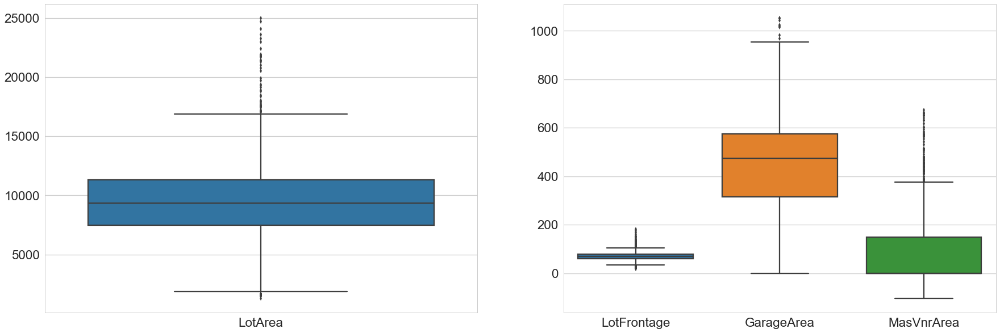

In [243]:
fig,(ax1,ax2)= plt.subplots(ncols=2)
sn.boxplot(data=df_drop[['LotArea']],ax=ax1)
sn.boxplot(data=df_drop[['LotFrontage','GarageArea','MasVnrArea']],ax=ax2)

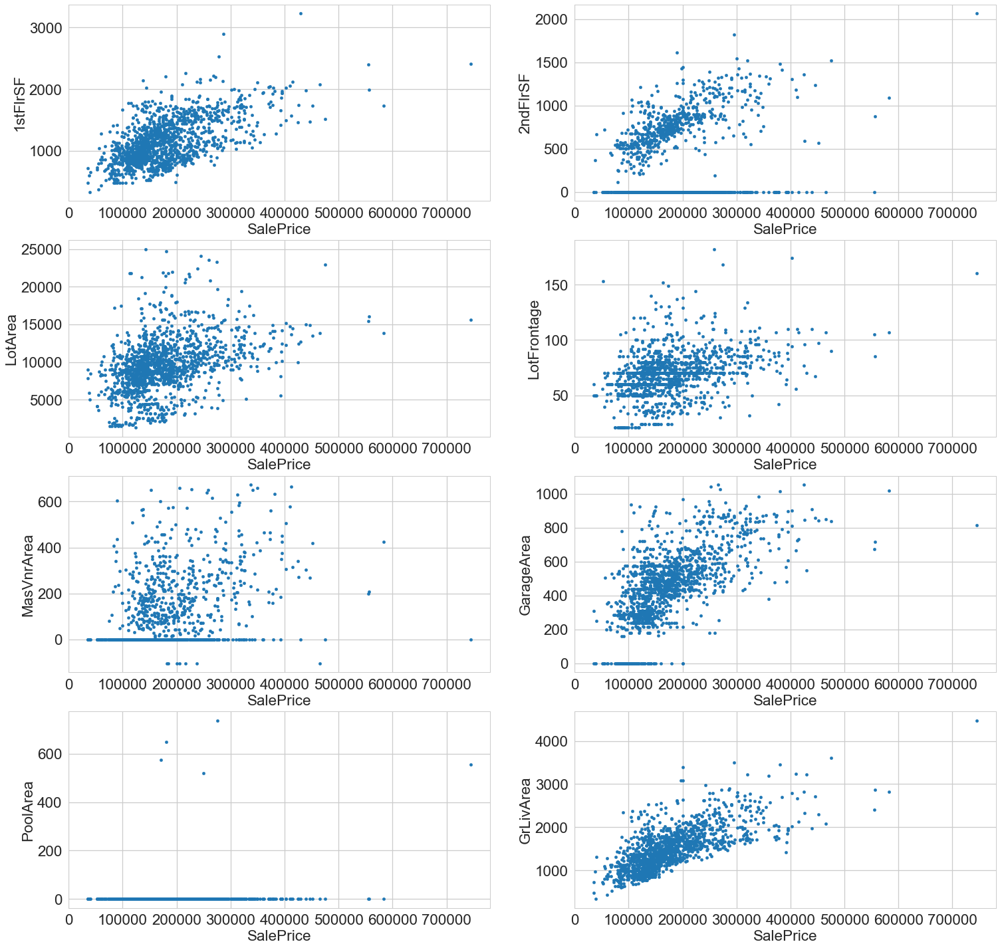

In [244]:
## Area Related Factors vs Sales Price - Scatter plot
fig, ((ax1, ax2),(ax3, ax4),(ax5, ax6),(ax7, ax8)) = plt.subplots(nrows=4, ncols=2,figsize=(25,25))

df_drop.plot(kind='scatter',x='SalePrice',y='1stFlrSF',ax=ax1)
df_drop.plot(kind='scatter',x='SalePrice',y='2ndFlrSF',ax=ax2)
df_drop.plot(kind='scatter',x='SalePrice',y='LotArea',ax=ax3)
df_drop.plot(kind='scatter',x='SalePrice',y='LotFrontage',ax=ax4)
df_drop.plot(kind='scatter',x='SalePrice',y='MasVnrArea',ax=ax5)
df_drop.plot(kind='scatter',x='SalePrice',y='GarageArea',ax=ax6)
df_drop.plot(kind='scatter',x='SalePrice',y='PoolArea',ax=ax7)
df_drop.plot(kind='scatter',x='SalePrice',y='GrLivArea',ax=ax8)

In [245]:
#Standardizing by centering
df['YrSold'] = centering(df['YrSold'])
df['YearBuilt'] = centering(df['YearBuilt'])
df['YearRemodAdd'] = centering(df['YearRemodAdd'])
df['GarageYrBlt'] = centering(df['GarageYrBlt'])

#Standardizing by min-max
df_drop['MSSubClass'] = standi(df_drop['MSSubClass'])
df_drop['LotFrontage'] = standi(df_drop['LotFrontage'])
df_drop['LotArea'] = standi(df_drop['LotArea'])
df_drop['MasVnrArea'] = standi(df_drop['MasVnrArea'])
df_drop['BsmtFinSF1'] = standi(df_drop['BsmtFinSF1'])
df_drop['BsmtFinSF2'] = standi(df_drop['BsmtFinSF2'])
df_drop['BsmtUnfSF'] = standi(df_drop['BsmtUnfSF'])
df_drop['LowQualFinSF'] = standi(df_drop['LowQualFinSF'])
df_drop['TotalBsmtSF'] = standi(df_drop['TotalBsmtSF'])
df_drop['1stFlrSF'] = standi(df_drop['1stFlrSF'])
df_drop['2ndFlrSF'] = standi(df_drop['2ndFlrSF'])
df_drop['GrLivArea'] = standi(df_drop['GrLivArea'])
df_drop['GarageArea'] = standi(df_drop['GarageArea'])
df_drop['WoodDeckSF'] = standi(df_drop['WoodDeckSF'])
df_drop['OpenPorchSF'] = standi(df_drop['OpenPorchSF'])
df_drop['EnclosedPorch'] = standi(df_drop['EnclosedPorch'])
df_drop['3SsnPorch'] = standi(df_drop['3SsnPorch'])
df_drop['ScreenPorch'] = standi(df_drop['ScreenPorch'])
df_drop['PoolArea'] = standi(df_drop['PoolArea'])
df_drop['MiscVal'] = standi(df_drop['MiscVal'])

In [246]:
def dv(df_col):
    return pd.value_counts(df_col.values, sort=False)

In [247]:
print(dv(df_drop['Utilities']))
print(1/1444)

AllPub    1404
NoSeWa       1
dtype: int64
0.0006925207756232687


In [248]:
#Predictors with low Var[] will not be include in X
dumMSZoning = pd.get_dummies(df_drop['MSZoning'], drop_first=True)
#MSZoning_C(all) = 0,0,0,0
dumMSZoning.rename(columns = { 'FV':'MSZoning_FV','RH':'MSZoning_RH','RL':'MSZoning_RL','RM':'MSZoning_RM'}, inplace = True)

dumlotshape = pd.get_dummies(df_drop['LotShape'], drop_first=True)
#LotShape_IR1 is 0,0,0
dumlotshape.rename(columns = { 'IR3':'LotShape_IR3','IR2':'LotShape_IR2','Reg':'LotShape_Reg'}, inplace = True)

dumLotConfig = pd.get_dummies(df_drop['LotConfig'], drop_first=True)
#LotConfig_Corner is 0,0,0,0
dumLotConfig.rename(columns = { 'CulDSac':'LotConfig_CulDSac','FR2':'LotConfig_FR2','FR3':'LotConfig_FR3','Inside':'LotConfig_Inside'}, inplace = True)

dumNBH = pd.get_dummies(df_drop['Neighborhood'], drop_first=True)
#len(set(df_drop['Neighborhood'])) = 25
#Bimngtn = 24*(0)

dumcon1 = pd.get_dummies(df_drop['Condition1'], drop_first=True)
#dumcon1_Artery = 0,0,0,0,0,0,0,0
dumcon1.rename(columns = { 'RRNe':'Condition1_RRNe','Feedr':'Condition1_Feedr','RRAn':'Condition1_RRAn','RRNn':'Condition1_RRNn','Norm':'Condition1_Norm','PosA':'Condition1_PosA','PosN':'Condition1_PosN','RRAe':'Condition1_RRAe'}, inplace = True)

dumBldgT = pd.get_dummies(df_drop['BldgType'], drop_first=True)
#1Fam 0,0,0,0

dumHS = pd.get_dummies(df_drop['HouseStyle'], drop_first=True)
#1.5Fin = 0,0,0,0,0,0,0

dumRS = pd.get_dummies(df_drop['RoofStyle'], drop_first=True)
#Flat 0,0,0,0

dumE1 = pd.get_dummies(df_drop['Exterior1st'], drop_first=True)
#Exterior1st_AsbShng = 0,0,0,0,0,0,0,0,0,0,0,0,0,0
dumE1.rename(columns = { 'BrkComm':'Exterior1st_BrkComm','AsphShn':'Exterior1st_AsphShn','CBlock':'Exterior1st_CBlock','BrkFace':'Exterior1st_BrkFace','CemntBd':'Exterior1st_CemntBd','HdBoard':'Exterior1st_HdBoard','ImStucc':'Exterior1st_ImStucc','MetalSd':'Exterior1st_MetalSd','Plywood':'Exterior1st_Plywood','Stone':'Exterior1st_Stone','Stucco':'Exterior1st_Stucco','VinylSd':'Exterior1st_VinylSd','Wd Sdng':'Exterior1st_Wd Sdng','WdShing':'Exterior1st_WdShing'}, inplace = True)

dumE2 = pd.get_dummies(df_drop['Exterior2nd'], drop_first=True)
#Exterior2nd_AsbShng = 0,0,0,0,0,0,0,0,0,0,0,0,0,0
dumE2.rename(columns = { 'CBlock':'Exterior2nd_CBlock','AsphShn':'Exterior2nd_AsphShn','Brk Cmn':'Exterior2nd_Brk Cmn','BrkFace':'Exterior2nd_BrkFace','CmentBd':'Exterior2nd_CmentBd','HdBoard':'Exterior2nd_HdBoard','ImStucc':'Exterior2nd_ImStucc','Other':'Exterior2nd_Other','Wd Shng':'Exterior2nd_Wd Shng','MetalSd':'Exterior2nd_MetalSd','Plywood':'Exterior2nd_Plywood','Stone':'Exterior2nd_Stone','Stucco':'Exterior2nd_Stucco','VinylSd':'Exterior2nd_VinylSd','Wd Sdng':'Exterior2nd_Wd Sdng','WdShing':'Exterior2nd_WdShing'}, inplace = True)

dumMVT = pd.get_dummies(df_drop['MasVnrType'], drop_first=True)
#MasVnrType_BrkCmn = 0,0,0
dumMVT.rename(columns = { 'BrkFace':'MasVnrType_BrkFace','None':'MasVnrType_None','Stone':'MasVnrType_Stone'}, inplace = True)

dumEQ = pd.get_dummies(df_drop['ExterQual'], drop_first=True)
dumEQ.rename(columns = { 'Fa':'ExterQual_Fa','Gd':'ExterQual_Gd','TA':'ExterQual_TA'}, inplace = True)
#ExterQual_Ex = 0,0,0

dumEC = pd.get_dummies(df_drop['ExterCond'], drop_first=True)
dumEC.rename(columns = { 'Fa':'ExterCond_Fa','Gd':'ExterCond_Gd','Po':'ExterCond_Po','TA':'ExterCond_TA'}, inplace = True)
#ExterCond_Ex = 0,0,0,0

dumF = pd.get_dummies(df_drop['Foundation'], drop_first=True)
#Foundation_BrkTil = 0,0,0,0
dumF.rename(columns = { 'Wood':'Foundation_Wood','CBlock':'Foundation_CBlock','PConc':'Foundation_PConc','Stone':'Foundation_Stone','Slab':'Foundation_Slab'}, inplace = True)

dumBQ = pd.get_dummies(df_drop['BsmtQual'], drop_first=True)
#BsmtQual_Ex = 0,0,0
dumBQ.rename(columns = { 'NoBasement':'BsmtQual_NoBasement','Fa':'BsmtQual_Fa','Gd':'BsmtQual_Gd','TA':'BsmtQual_TA'}, inplace = True)

dumBEx = pd.get_dummies(df_drop['BsmtExposure'], drop_first=True)
#BsmtExposure_Av = 0,0,0
dumBEx.rename(columns = { 'NoBasement':'BsmtExposure_NoBasement','Mn':'BsmtExposure_Mn','Gd':'BsmtExposure_Gd','No':'BsmtExposure_No'}, inplace = True)

dumHQC = pd.get_dummies(df_drop['HeatingQC'], drop_first=True)
#HeatingQC_Ex = 0,0,0,0
dumHQC.rename(columns = { 'Fa':'HeatingQC_Fa','Gd':'HeatingQC_Gd','Po':'HeatingQC_Po','TA':'HeatingQC_TA'}, inplace = True)

dumCA = pd.get_dummies(df_drop['CentralAir'], drop_first=True)
#CentralAir_N = 0
dumCA.rename(columns = { 'Y':'CentralAir_Y'}, inplace = True)

dumElectrical = pd.get_dummies(df_drop['Electrical'], drop_first=True)
#FuseA = 0,0,0,0
dumElectrical.rename(columns = { 'FuseF':'Electrical_FuseF','FuseP':'Electrical_FuseP','Mix':'Electrical_Mix','SBrkr':'Electrical_SBrkr'}, inplace = True)

dumKQ = pd.get_dummies(df_drop['KitchenQual'], drop_first=True)
#KitchenQual_Ex = 0,0,0
dumKQ.rename(columns = { 'Fa':'KitchenQual_Fa','Gd':'KitchenQual_Gd','TA':'KitchenQual_TA'}, inplace = True)

dumFQC = pd.get_dummies(df_drop['FireplaceQu'], drop_first=True)
#FireplaceQu_Ex = 0,0,0,0,0
dumFQC.rename(columns = { 'Po':'FireplaceQu_Po','Fa':'FireplaceQu_Fa','Gd':'FireplaceQu_Gd','TA':'FireplaceQu_TA'}, inplace = True)

dumGT = pd.get_dummies(df_drop['GarageType'], drop_first=True)
#GarageType_2Types = 0,0,0,0,0
dumGT.rename(columns = { 'NoGarge':'GarageType_NoGarge','Attchd':'GarageType_Attchd','Basment':'GarageType_Basement','BuiltIn':'GarageType_BuiltIn','CarPort':'GarageType_CarPort','Detchd':'GarageType_Detchd'}, inplace = True)

dumGF = pd.get_dummies(df_drop['GarageFinish'], drop_first=True)
#GarageFinish_Fin = 0,0
dumGF.rename(columns = { 'NoGarge':'GarageFinish_NoGarge','RFn':'GarageFinish_RFn','Unf':'GarageFinish_Unf'}, inplace = True)

dumGQ = pd.get_dummies(df_drop['GarageQual'], drop_first=True)
#GarageQual_Ex = 0,0,0
dumGQ.rename(columns = { 'NoGarge':'GarageQual_NoGarge', 'Fa':'GarageQual_Fa','Gd':'GarageQual_Gd','TA':'GarageQual_TA','Po':'GarageQual_Po'}, inplace = True)

dumGCond = pd.get_dummies(df_drop['GarageCond'], drop_first=True)
#GarageCond_Ex = 0,0,0,0
dumGCond.rename(columns = { 'NoGarge':'GarageCond_NoGarge','Fa':'GarageCond_Fa','Gd':'GarageCond_Gd','TA':'GarageCond_TA','Po':'GarageCond_Po'}, inplace = True)

dumPavedDrive = pd.get_dummies(df_drop['PavedDrive'], drop_first=True)
#PavedDrive_N = 0,0
dumPavedDrive.rename(columns = { 'P':'PavedDrive_P','Y':'PavedDrive_Y'}, inplace = True)

dumFence = pd.get_dummies(df_drop['Fence'], drop_first=True)
#Fence_GdPrv = 0,0,0,0
dumFence.rename(columns = { 'GdWo':'Fence_GdWo','MnPrv':'Fence_MnPrv','NoFence':'Fence_NoFence','MnWw':'Fence_MnWw'}, inplace = True)

dumSaleType = pd.get_dummies(df_drop['SaleType'], drop_first=True)
#SaleType_COD = 0,0,0,0,0,0,0
dumSaleType.rename(columns = { 'CWD':'SaleType_CWD','Con':'SaleType_Con','Oth':'SaleType_Oth','ConLD':'SaleType_ConLD','ConLI':'SaleType_ConLI','ConLw':'SaleType_ConLw','New':'SaleType_New','WD':'SaleType_WD'}, inplace = True)

dumSaleCondition = pd.get_dummies(df_drop['SaleCondition'], drop_first=True)
#SaleCondition_Abnorml = 0,0,0,0
dumSaleCondition.rename(columns = { 'AdjLand':'SaleCondition_AdjLand','Alloca':'SaleCondition_Alloca','Family':'SaleCondition_Family','Normal':'SaleCondition_Normal','Partial':'SaleCondition_Partial'}, inplace = True)

X = pd.concat([df_drop[['MSSubClass']], dumMSZoning, df_drop[['LotFrontage','LotArea']],dumlotshape,dumLotConfig,dumNBH],axis = 1)
X = pd.concat([X, dumcon1,dumBldgT, dumHS,df_drop[['OverallQual','OverallCond','YearBuilt','YearRemodAdd']]],axis = 1)
X = pd.concat([X, dumRS, dumE1, dumE2, dumMVT, df_drop[['MasVnrArea']]],1)
X = pd.concat([X,dumEQ,dumEC,dumF,dumBQ,dumBEx,df_drop[['BsmtFinSF1']]],1)
X = pd.concat([X,df_drop[['BsmtFinSF2','BsmtUnfSF','TotalBsmtSF']],dumHQC,dumCA,dumElectrical,df_drop[['1stFlrSF','2ndFlrSF']]],1)
X = pd.concat([X,df_drop[['LowQualFinSF','GrLivArea','BsmtFullBath','BsmtHalfBath','FullBath','HalfBath','BedroomAbvGr','KitchenAbvGr']],dumKQ],1)
X = pd.concat([X,df_drop[['TotRmsAbvGrd']],df_drop[['Fireplaces']],dumGT,df_drop[['GarageYrBlt']],dumGF,df_drop[['GarageCars','GarageArea']]],1)
X = pd.concat([X,dumGQ,dumGCond,dumPavedDrive,df_drop[['WoodDeckSF','OpenPorchSF','EnclosedPorch','3SsnPorch','ScreenPorch','PoolArea']]],1)
X = pd.concat([X,dumFence,df_drop[['MiscVal','MoSold','YrSold']],dumSaleType,dumSaleCondition],1)


In [249]:
X = pd.concat([X,df_drop[['SalePrice']]],1)

In [250]:
## Sample the dataset and divide into two part: Training set 70% Testing set 30%
X_train, X_test, y_train, y_test = train_test_split(X.iloc[:,0:-1],X.iloc[:,-1],test_size=0.3,random_state=42)
X_train.reset_index(inplace=True)
y_train = y_train.reset_index()
X_test.reset_index(inplace=True)
y_test = y_test.reset_index()
print("Training set::{}{}".format(X_train.shape,y_train.shape))
print("Testing set::{}".format(X_test.shape))

Training set::(983, 198)(983, 2)
Testing set::(422, 198)


In [251]:
lin_reg = linear_model.LinearRegression()
X_train=X_train.astype(float)
lin_reg.fit(X_train,y_train)
print(lin_reg.coef_)

[[ 1.00000000e+00  5.91850615e-14 -9.98682460e-14 -1.06704150e-13
  -8.26413848e-14 -1.30602208e-13  3.50356247e-14 -1.01130108e-13
  -1.04395802e-15 -2.62324034e-15  2.41276845e-15  2.53880330e-15
  -2.68017769e-15 -2.06541029e-15 -1.34524035e-15 -1.63084832e-14
   9.58271794e-15  6.45783194e-15 -1.72583540e-14  1.09254079e-14
   3.51568956e-15  2.59150607e-15  1.62431121e-14  3.72865391e-15
  -1.43185880e-14 -1.89206819e-15  5.12091035e-16 -1.35648892e-14
   1.33016785e-14  1.57012979e-14  3.48561358e-15  1.21039753e-14
   2.46712832e-15  7.76333036e-15 -6.66799067e-15  4.99586068e-15
   1.14497532e-14  1.34656007e-14  9.71734451e-15  3.40915309e-15
   1.99551948e-15 -4.92348534e-15  3.31195626e-15 -1.05039900e-15
  -4.48042055e-15  3.93506869e-14 -2.14224433e-14 -3.92461117e-14
  -1.73375799e-14 -4.63377399e-15 -6.93293986e-15  2.04308867e-14
   4.55512234e-15  2.18902562e-15 -1.15712312e-15 -1.12724701e-14
  -2.32378293e-15  1.02901501e-14 -5.84068614e-16  3.37924222e-16
   2.64928

In [252]:
y_train2 = y_train.SalePrice.values.reshape(-1,1)
X_train2 = sm.add_constant(X_train, prepend=False)
y_train2 = pd.DataFrame(y_train2)
reg = sm.OLS(y_train2,X_train2).fit()
print(reg.summary())
X_train2

                            OLS Regression Results                            
Dep. Variable:                      0   R-squared:                       0.935
Model:                            OLS   Adj. R-squared:                  0.919
Method:                 Least Squares   F-statistic:                     61.51
Date:                Mon, 15 Oct 2018   Prob (F-statistic):               0.00
Time:                        10:17:34   Log-Likelihood:                -11043.
No. Observations:                 983   AIC:                         2.246e+04
Df Residuals:                     797   BIC:                         2.337e+04
Df Model:                         185                                         
Covariance Type:            nonrobust                                         
                              coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------
index                     

,index,MSSubClass,MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,LotFrontage,LotArea,LotShape_IR2,LotShape_IR3,...,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial,const
0,846.0,0.235294,0.0,0.0,1.0,0.0,0.335404,0.338270,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0
1,805.0,0.000000,0.0,0.0,1.0,0.0,0.434783,0.463038,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0
2,444.0,0.235294,0.0,0.0,1.0,0.0,0.304348,0.314346,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0
3,971.0,0.823529,0.0,0.0,1.0,0.0,0.093168,0.040844,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0
4,245.0,0.000000,0.0,0.0,1.0,0.0,0.366460,0.383966,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0
5,91.0,0.000000,0.0,0.0,1.0,0.0,0.397516,0.303797,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0
6,861.0,1.000000,0.0,0.0,1.0,0.0,0.335404,0.435654,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0
7,946.0,0.352941,0.0,0.0,1.0,0.0,0.304348,0.289578,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0
8,638.0,0.058824,0.0,0.0,1.0,0.0,0.285714,0.315485,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0
9,610.0,0.235294,0.0,0.0,1.0,0.0,0.304658,0.411392,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0


In [253]:
def dropp():
    a = 0
    i = 0
    tt = pvalue['p'].max()
    print(tt)
    for each in pvalue['p']:
        if each == tt and each >= 0.05:
            a = i
        i += 1
    print(a)
    return a,tt

In [254]:
pvalue = []
i = 0
o = 0
while i < 198:
    o = reg.pvalues[i]
    pvalue.append(o)
    i += 1
pvalue = pd.DataFrame(pvalue)
pvalue.columns = ['p']
pvalue

,p
0,0.659843
1,0.228703
2,0.000478
3,0.039828
4,0.009417
5,0.023763
6,0.117728
7,0.000006
8,0.414348
9,0.256327


In [255]:
#by setting alpha = 0.05, 
#ratio = categorical variables that have most frequent value over 2 most frequent value. 
#ratio <= 0.05 will be dropped
while True:
    droppp = False
    a = dropp()
    pppp = a[0]
    pmax = a[1]
    if pmax >= 0.05:
        droppp = True
    if droppp == True:
        print("dropped",X_train2.columns.get_values()[pppp])
        print(X_train2.shape)
        X_train2 = X_train2.drop([X_train2.columns.get_values()[pppp]],axis=1)
        pvalue = pvalue.drop([pppp])
        X_train2 = X_train2.reset_index(drop=True)
        pvalue = pvalue.reset_index(drop=True)
        print("after drop:", X_train2.shape)
    else:
        print("Stopped")
        break
X_train2

0.9925593822627821
138
dropped BsmtHalfBath
(983, 199)
after drop: (983, 198)
0.9860904961936685
179
dropped Fence_MnWw
(983, 198)
after drop: (983, 197)
0.9756057858498619
94
dropped Exterior2nd_Wd Sdng
(983, 197)
after drop: (983, 196)
0.9686230704530379
129
dropped Electrical_FuseP
(983, 196)
after drop: (983, 195)
0.9525824054318487
82
dropped Exterior2nd_Brk Cmn
(983, 195)
after drop: (983, 194)
0.9523006399951922
165
dropped GarageCond_TA
(983, 194)
after drop: (983, 193)
0.9509561577120986
143
dropped Fireplaces
(983, 193)
after drop: (983, 192)
0.9448562758243629
127
dropped Electrical_FuseF
(983, 192)
after drop: (983, 191)
0.936736660367083
181
dropped SaleType_ConLw
(983, 191)
after drop: (983, 190)
0.9331915077209909
80
dropped Exterior1st_WdShing
(983, 190)
after drop: (983, 189)
0.9287803398186107
179
dropped SaleType_ConLI
(983, 189)
after drop: (983, 188)
0.9281486104682427
76
dropped Exterior1st_Stone
(983, 188)
after drop: (983, 187)
0.9243709703307261
141
dropped Gar

,MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,LotArea,Edwards,Gilbert,Mitchel,NAmes,NWAmes,...,KitchenQual_Gd,KitchenQual_TA,GarageArea,WoodDeckSF,OpenPorchSF,ScreenPorch,PoolArea,SaleType_CWD,SaleCondition_Normal,const
0,0.0,0.0,1.0,0.0,0.338270,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.403609,0.317935,0.131627,0.0,0.000000,0.0,1.0,1.0
1,0.0,0.0,1.0,0.0,0.463038,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.526116,0.000000,0.109689,0.0,0.000000,0.0,0.0,1.0
2,0.0,0.0,1.0,0.0,0.314346,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.468186,0.195652,0.243144,0.0,0.000000,0.0,1.0,1.0
3,0.0,0.0,1.0,0.0,0.040844,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.450142,0.000000,0.049360,0.0,0.000000,0.0,1.0,1.0
4,0.0,0.0,1.0,0.0,0.383966,0.0,0.0,0.0,0.0,1.0,...,0.0,1.0,0.573599,0.267663,0.071298,0.0,0.000000,0.0,1.0,1.0
5,0.0,0.0,1.0,0.0,0.303797,0.0,0.0,0.0,1.0,0.0,...,0.0,1.0,0.455840,0.000000,0.000000,0.0,0.000000,0.0,0.0,1.0
6,0.0,0.0,1.0,0.0,0.435654,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.478632,0.000000,0.000000,0.0,0.000000,0.0,1.0,1.0
7,0.0,0.0,1.0,0.0,0.289578,0.0,0.0,0.0,1.0,0.0,...,0.0,1.0,0.755935,0.116848,0.000000,0.0,0.000000,0.0,1.0,1.0
8,0.0,0.0,1.0,0.0,0.315485,1.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.000000,0.445652,0.000000,0.0,0.000000,0.0,1.0,1.0
9,0.0,0.0,1.0,0.0,0.411392,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.698955,0.343750,0.259598,0.0,0.000000,0.0,1.0,1.0


In [256]:
## Assumption checking - Check for multicolinearity
## Correlation matrix between the predictors - correlational matrix
## 
# For each Xi, calculate VIF
vif = pd.DataFrame()
vif["VIF Factor"] = [variance_inflation_factor(X_train2.values, i) for i in range(X_train2.shape[1])]
# X_train.shape[1] refers to the column number
vif["features"] = X_train2.columns
vif.round(1)

,VIF Factor,features
0,8.8,MSZoning_FV
1,2.5,MSZoning_RH
2,28.3,MSZoning_RL
3,20.9,MSZoning_RM
4,1.8,LotArea
5,1.3,Edwards
6,1.4,Gilbert
7,1.2,Mitchel
8,1.7,NAmes
9,1.3,NWAmes


In [257]:
def vifcl(df):
    a = 0
    i = 0
    vif = pd.DataFrame()
    vif["VIF Factor"] = [variance_inflation_factor(df.values, i) for i in range(df.shape[1])]
    vif["features"] = df.columns
    t = vif["VIF Factor"].max()
    for each in vif["VIF Factor"]:
        if each == t and each >= 10:
            a = i
        i += 1
    print(vif.loc[a],"\n>15")
    print(a)
    return a

In [258]:
def vifvax(df):
    a = 0
    i = 0
    vif = pd.DataFrame()
    vif["VIF Factor"] = [variance_inflation_factor(df.values, i) for i in range(df.shape[1])]
    vif["features"] = df.columns
    t = vif["VIF Factor"].max()
    for each in vif["VIF Factor"]:
        if each == t and each >= 10:
            a = i
        i += 1
    vax = vif["VIF Factor"].loc[a]
    return vax

In [259]:
while True:
    vmax = 0
    dropt = False
    k = vifcl(X_train2)
    s = vifvax(X_train2)
    print(s)
    if s >= 10:
        dropt = True
    if dropt == True:
        print("dropped",X_train2.columns.get_values()[k])
        X_train2 = X_train2.drop([X_train2.columns.get_values()[k]],axis=1)
        vif = vif.drop([k])
        X_train2 = X_train2.reset_index(drop=True)
        vif = vif.reset_index(drop=True)
    else:
        break
X_train2

VIF Factor    18938.6
features        const
Name: 44, dtype: object 
>15
44
18938.629660126266
dropped const
VIF Factor      833.507
features      GrLivArea
Name: 30, dtype: object 
>15
30
833.5065894797733
dropped GrLivArea
VIF Factor      292.321
features      YearBuilt
Name: 16, dtype: object 
>15
16
292.32050202490785
dropped YearBuilt
VIF Factor        87.7763
features      TotalBsmtSF
Name: 26, dtype: object 
>15
26
87.77634231352452
dropped TotalBsmtSF
VIF Factor        82.9591
features      MSZoning_RL
Name: 2, dtype: object 
>15
2
82.95914217041678
dropped MSZoning_RL
VIF Factor        55.1106
features      OverallQual
Name: 13, dtype: object 
>15
13
55.11056071978215
dropped OverallQual
VIF Factor         27.4674
features      BedroomAbvGr
Name: 28, dtype: object 
>15
28
27.467405638798965
dropped BedroomAbvGr
VIF Factor         23.743
features      OverallCond
Name: 13, dtype: object 
>15
13
23.743042901383316
dropped OverallCond
VIF Factor     22.3917
features      1stFlrSF

,MSZoning_FV,MSZoning_RH,MSZoning_RM,LotArea,Edwards,Gilbert,Mitchel,NAmes,NWAmes,StoneBr,...,BsmtFullBath,KitchenQual_Fa,KitchenQual_Gd,KitchenQual_TA,WoodDeckSF,OpenPorchSF,ScreenPorch,PoolArea,SaleType_CWD,SaleCondition_Normal
0,0.0,0.0,0.0,0.338270,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,1.0,0.0,0.317935,0.131627,0.0,0.000000,0.0,1.0
1,0.0,0.0,0.0,0.463038,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.000000,0.109689,0.0,0.000000,0.0,0.0
2,0.0,0.0,0.0,0.314346,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,1.0,0.0,0.195652,0.243144,0.0,0.000000,0.0,1.0
3,0.0,0.0,0.0,0.040844,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.000000,0.049360,0.0,0.000000,0.0,1.0
4,0.0,0.0,0.0,0.383966,0.0,0.0,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,1.0,0.267663,0.071298,0.0,0.000000,0.0,1.0
5,0.0,0.0,0.0,0.303797,0.0,0.0,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.000000,0.000000,0.0,0.000000,0.0,0.0
6,0.0,0.0,0.0,0.435654,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,1.0,0.000000,0.000000,0.0,0.000000,0.0,1.0
7,0.0,0.0,0.0,0.289578,0.0,0.0,0.0,1.0,0.0,0.0,...,1.0,0.0,0.0,1.0,0.116848,0.000000,0.0,0.000000,0.0,1.0
8,0.0,0.0,0.0,0.315485,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.445652,0.000000,0.0,0.000000,0.0,1.0
9,0.0,0.0,0.0,0.411392,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.343750,0.259598,0.0,0.000000,0.0,1.0


In [260]:
y_train = pd.DataFrame(y_train)
X_train3 = X_train2
vif = pd.DataFrame()
vif["VIF Factor"] = [variance_inflation_factor(X_train3.values, i) for i in range(X_train3.shape[1])]
vif["features"] = X_train3.columns
vif.round(1)

,VIF Factor,features
0,1.4,MSZoning_FV
1,1.0,MSZoning_RH
2,1.7,MSZoning_RM
3,9.1,LotArea
4,1.3,Edwards
5,1.3,Gilbert
6,1.1,Mitchel
7,1.9,NAmes
8,1.3,NWAmes
9,1.1,StoneBr


In [261]:
df2 = X_train3.copy()
df2['SalePrice']=y_train2
df2.to_csv('clean.csv',index=False)

In [262]:
## Model after forward selection
def processSubset(feature_set):
    # Fit model on feature_set and calculate AIC
    X_select = X_train3[list(feature_set)]
    X12 = sm.add_constant(X_select, prepend=False)
    model = sm.OLS(y_train2,X12)
    regr = model.fit()
    aic = regr.aic
    return {"model":regr, "AIC":aic, "predict":feature_set}

In [263]:
def getBest(k):
    
    tic = time.time()
    
    results = []
    
    for combo in itertools.combinations(X_train3.columns, k):
        results.append(processSubset(combo))
    
    # Wrap everything up in a nice dataframe
    models = pd.DataFrame(results)
    
    # Choose the model with the lowest AIC
    best_model = models.loc[models['AIC'].argmin()]
    
    toc = time.time()
    print("Processed", models.shape[0], "models on", k, "predictors in", (toc-tic), "seconds.")
    
    # Return the best model, along with some other useful information about the model
    return best_model

In [264]:
def forward(predictors):
    
    if 'const' in predictors:
        predictors.remove('const')
    
    
    # Pull out predictors we still need to process
    remaining_predictors = [p for p in X_train3.columns if p not in predictors]
    
    tic = time.time()
    
    results = []
    
    for p in remaining_predictors:
        results.append(processSubset(predictors+[p]))
    
    # Wrap everything up in a nice dataframe
    models = pd.DataFrame(results)
    aic=[]
    name=[]
    predict=[]
    for i in range(len(results)):
        aic.append(results[i]['AIC'])
        name.append(results[i]['model'])
        predict.append(results[i]['predict'])
        
    
    models['AIC']=aic
    models['model']=name
    models['predict']=predict
    
    # Choose the model with the lowest AIC
    best_model = models.loc[models['AIC'].argmin()]
    
    toc = time.time()
    print("Processed ", models.shape[0], "models on", len(predictors)+1, "predictors in", (toc-tic), "seconds.")
    
    # Return the best model, along with some other useful information about the model
    return best_model

In [265]:
models_fwd = pd.DataFrame(columns=["AIC", "model","predict"])

tic = time.time()
predictors = []

for i in range(1,len(X_train3.columns)+1):    
    models_fwd.loc[i] = forward(predictors)
    predictors = models_fwd.loc[i]["model"].model.exog_names

toc = time.time()
print("Total elapsed time:", (toc-tic), "seconds.")

/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:33: FutureWarning: 'argmin' is deprecated, use 'idxmin' instead. The behavior of 'argmin'
will be corrected to return the positional minimum in the future.
Use 'series.values.argmin' to get the position of the minimum now.


Processed  33 models on 1 predictors in 0.17267394065856934 seconds.
Processed  32 models on 2 predictors in 0.18142008781433105 seconds.
Processed  31 models on 3 predictors in 0.1714792251586914 seconds.
Processed  30 models on 4 predictors in 0.1810166835784912 seconds.
Processed  29 models on 5 predictors in 0.17530488967895508 seconds.
Processed  28 models on 6 predictors in 0.1724250316619873 seconds.
Processed  27 models on 7 predictors in 0.14826226234436035 seconds.
Processed  26 models on 8 predictors in 0.15119695663452148 seconds.
Processed  25 models on 9 predictors in 0.14790892601013184 seconds.
Processed  24 models on 10 predictors in 0.1394052505493164 seconds.
Processed  23 models on 11 predictors in 0.1527559757232666 seconds.
Processed  22 models on 12 predictors in 0.1388988494873047 seconds.
Processed  21 models on 13 predictors in 0.15044903755187988 seconds.
Processed  20 models on 14 predictors in 0.1373889446258545 seconds.
Processed  19 models on 15 predictor

In [266]:
models_fwd

,AIC,model,predict
1,24423.538570,<statsmodels.regression.linear_model.Regressio...,[Foundation_PConc]
2,24198.614334,<statsmodels.regression.linear_model.Regressio...,"[Foundation_PConc, LotArea]"
3,24085.912619,<statsmodels.regression.linear_model.Regressio...,"[Foundation_PConc, LotArea, BsmtFinSF1]"
4,23916.380163,<statsmodels.regression.linear_model.Regressio...,"[Foundation_PConc, LotArea, BsmtFinSF1, BsmtUn..."
5,23648.056251,<statsmodels.regression.linear_model.Regressio...,"[Foundation_PConc, LotArea, BsmtFinSF1, BsmtUn..."
6,23558.159240,<statsmodels.regression.linear_model.Regressio...,"[Foundation_PConc, LotArea, BsmtFinSF1, BsmtUn..."
7,23499.987337,<statsmodels.regression.linear_model.Regressio...,"[Foundation_PConc, LotArea, BsmtFinSF1, BsmtUn..."
8,23462.073088,<statsmodels.regression.linear_model.Regressio...,"[Foundation_PConc, LotArea, BsmtFinSF1, BsmtUn..."
9,23427.181706,<statsmodels.regression.linear_model.Regressio...,"[Foundation_PConc, LotArea, BsmtFinSF1, BsmtUn..."
10,23326.855359,<statsmodels.regression.linear_model.Regressio...,"[Foundation_PConc, LotArea, BsmtFinSF1, BsmtUn..."


In [267]:
## select the best model
index = models_fwd['AIC'].argmin()
predictor = models_fwd.loc[index, 'predict']
print(predictor)

['Foundation_PConc', 'LotArea', 'BsmtFinSF1', 'BsmtUnfSF', '2ndFlrSF', 'KitchenQual_TA', 'MasVnrType_Stone', 'StoneBr', 'KitchenQual_Fa', 'KitchenQual_Gd', 'BsmtQual_TA', 'BsmtQual_Gd', 'BsmtExposure_Gd', 'Edwards', 'MSZoning_RM', 'WoodDeckSF', 'ScreenPorch', 'OpenPorchSF', 'SaleType_CWD', 'Condition1_Norm', 'Mitchel', 'PoolArea', 'Condition1_RRAe', 'NAmes', 'BsmtFullBath', 'Gilbert', 'MSZoning_RH', 'ExterQual_Gd']


/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:2: FutureWarning: 'argmin' is deprecated, use 'idxmin' instead. The behavior of 'argmin'
will be corrected to return the positional minimum in the future.
Use 'series.values.argmin' to get the position of the minimum now.
  


In [268]:
## see the model after selection
X_train4 = X_train3[predictor]
X_train4 = sm.add_constant(X_train4, prepend=False)
reg_selection = sm.OLS(y_train2,X_train4).fit()
print(reg_selection.summary())

                            OLS Regression Results                            
Dep. Variable:                      0   R-squared:                       0.822
Model:                            OLS   Adj. R-squared:                  0.817
Method:                 Least Squares   F-statistic:                     157.7
Date:                Mon, 15 Oct 2018   Prob (F-statistic):               0.00
Time:                        10:17:44   Log-Likelihood:                -11533.
No. Observations:                 983   AIC:                         2.312e+04
Df Residuals:                     954   BIC:                         2.327e+04
Df Model:                          28                                         
Covariance Type:            nonrobust                                         
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
Foundation_PConc  1.351e+04   3210.612  

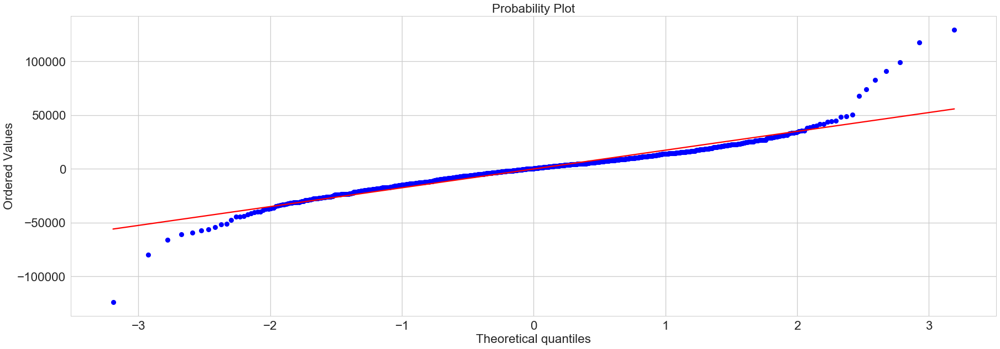

In [269]:
## Assumption checking - Normality Test(Q-Q Plot), using residual
stats.probplot(reg.resid, dist="norm", plot=plt)
plt.show()

(array([ 1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  1.,  0.,  0.,  0.,  0.,  1.,  0.,  1.,  1.,
         2.,  1.,  2.,  0.,  1.,  3.,  3.,  3.,  4.,  6., 10.,  9., 14.,
        20., 17., 25., 30., 45., 34., 48., 63., 63., 81., 71., 89., 66.,
        56., 43., 43., 25., 21., 20., 14.,  9.,  7.,  5.,  6.,  1.,  3.,
         2.,  3.,  1.,  2.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,  0.,
         1.,  0.,  0.,  1.,  0.,  0.,  1.,  0.,  0.,  0.,  1.,  0.,  0.,
         0.,  0.,  0.,  0.,  1.,  0.,  0.,  0.,  1.]),
 array([-123810.46742945, -121276.1552243 , -118741.84301914,
        -116207.53081399, -113673.21860884, -111138.90640368,
        -108604.59419853, -106070.28199337, -103535.96978822,
        -101001.65758307,  -98467.34537791,  -95933.03317276,
         -93398.72096761,  -90864.40876245,  -88330.0965573 ,
         -85795.78435214,  -83261.47214699,  -80727.15994184,
         -78192.84773668,  -75658.53553153,  -73124.22332637,


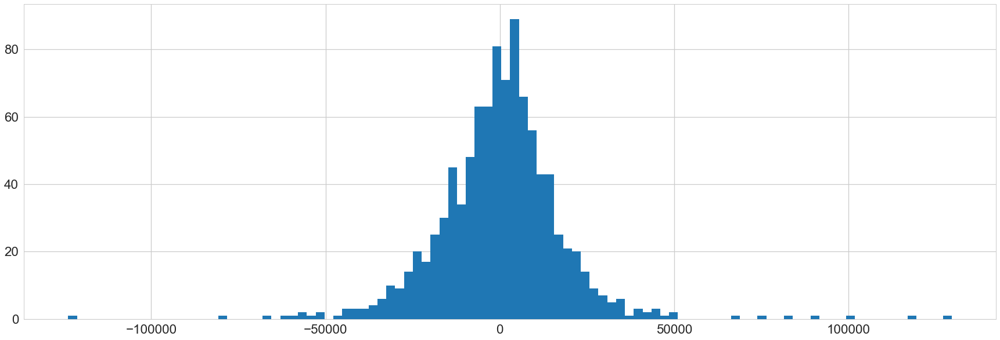

In [270]:
## Also use histogram to check the normality, using residual
plt.hist(reg.resid, 100)

Text(0,0.5,'residual')

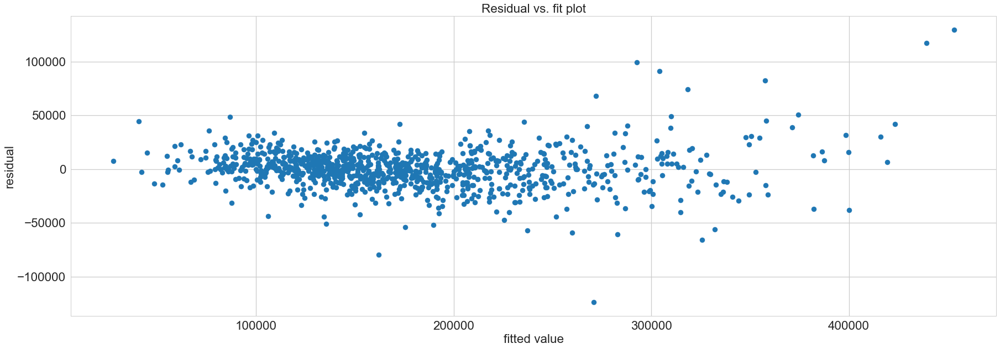

In [271]:
## Assumption checking - constant variance assumption and mean-zero assumption
# reg.resid, reg.fittedvalues
plt.scatter(reg.fittedvalues,reg.resid)
plt.title("Residual vs. fit plot")
plt.xlabel("fitted value")
plt.ylabel("residual")

Text(0,0.5,'residual')

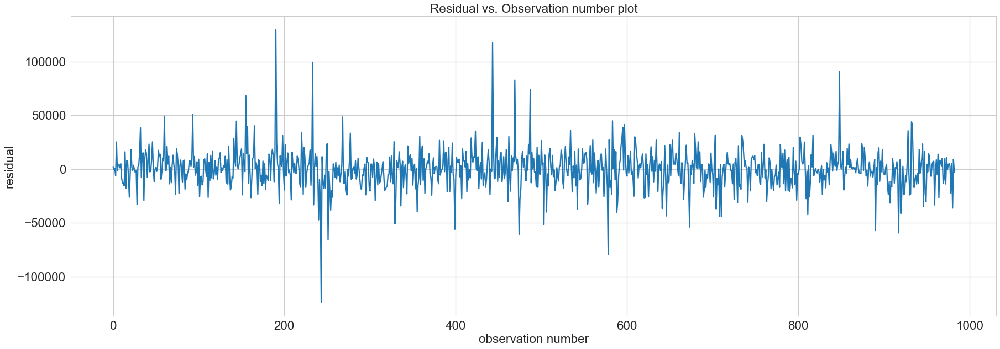

In [272]:
## Assumption checking - constant variance assumption and mean-zero assumption
plt.plot(reg.resid, '-')  # solid line
plt.title("Residual vs. Observation number plot")
plt.xlabel("observation number")
plt.ylabel("residual")

In [273]:
#make sure VIF is below 10
vif = pd.DataFrame()
vif["VIF Factor"] = [variance_inflation_factor(X_train4.values, i) for i in range(X_train4.shape[1])]
vif["features"] = X_train4.columns
vif.round(1)

,VIF Factor,features
0,2.7,Foundation_PConc
1,1.5,LotArea
2,2.9,BsmtFinSF1
3,2.4,BsmtUnfSF
4,1.4,2ndFlrSF
5,8.2,KitchenQual_TA
6,1.3,MasVnrType_Stone
7,1.1,StoneBr
8,1.9,KitchenQual_Fa
9,6.9,KitchenQual_Gd


In [274]:
## For the model selected by stepwise selection, 
## using the k-fold cross validation (specifically 10-fold) to reduce overfitting affects
# cross_val_predict function returns cross validated prediction values as fitted by the model object.
# predicted = cross_val_predict(lin_reg, X_train, y_train, cv=10)
lin_reg_s = linear_model.LinearRegression()
lin_reg_s = lin_reg_s.fit(X_train4, y_train2)
predicted = cross_val_predict(lin_reg_s, X_train3, y_train2, cv=10)

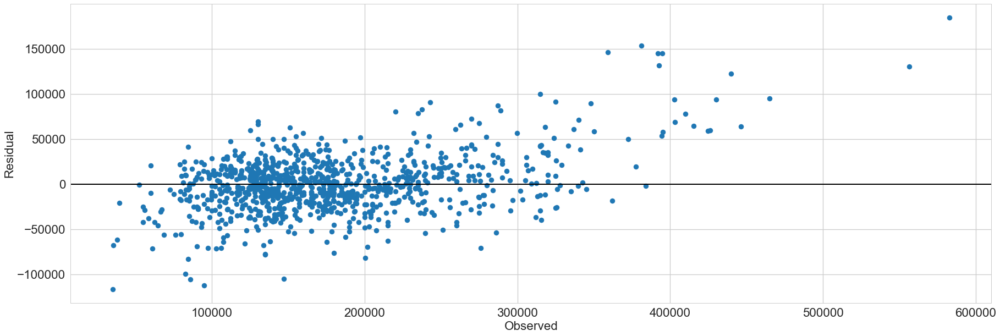

In [275]:
## Assumption checking - check of homoscedasticity
## residual plot
fig, ax = plt.subplots()
ax.scatter(y_train2, y_train2-predicted)
ax.axhline(lw=2,color='black')
ax.set_xlabel('Observed')
ax.set_ylabel('Residual')
plt.show()

In [276]:
## calculate the cross validation scores and plot them
r2_scores = cross_val_score(lin_reg_s, X_train4, y_train2, cv=10)
mse_scores = cross_val_score(lin_reg_s, X_train4, y_train2, cv=10,scoring='neg_mean_squared_error')
print("R-squared::{}".format(r2_scores))
print("MSE::{}".format(mse_scores))

R-squared::[0.81617579 0.80371184 0.71453003 0.75373873 0.83654727 0.85477027
 0.84430044 0.79297458 0.77060967 0.78797141]
MSE::[-9.13175324e+08 -9.86997382e+08 -1.19443699e+09 -1.19543213e+09
 -1.32727452e+09 -7.59435644e+08 -9.22978840e+08 -8.95133980e+08
 -9.15999184e+08 -8.38646879e+08]


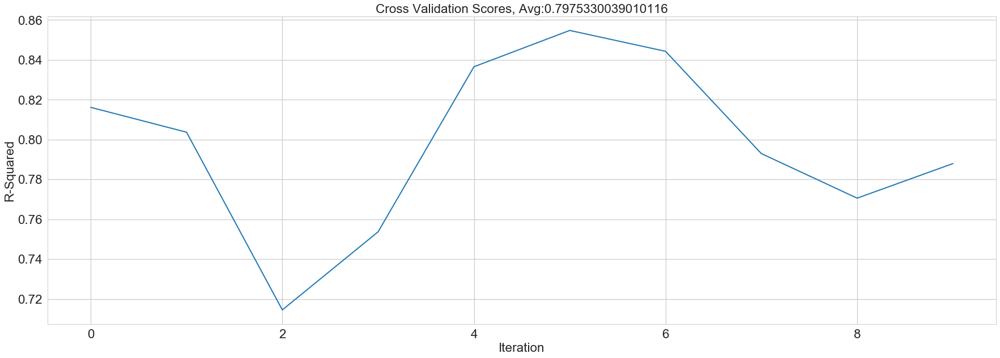

In [277]:
fig, ax = plt.subplots()
ax.plot([i for i in range(len(r2_scores))],r2_scores,lw=2)
ax.set_xlabel('Iteration')
ax.set_ylabel('R-Squared')
ax.title.set_text("Cross Validation Scores, Avg:{}".format(np.average(r2_scores)))
plt.show()

In [278]:
## test dataset
X_test=X_test.astype(float)
X_test2 = X_test[predictor]
lin_reg_s_test = linear_model.LinearRegression()
lin_reg_s_test = lin_reg_s.fit(X_test2, y_test)
# y_test = y_test.total_count.values.reshape(-1,1)
y_test = pd.DataFrame(y_test)
y_pred = lin_reg_s_test.predict(X_test2)
y_pred = pd.DataFrame(y_pred)
residuals = y_test-y_pred

/anaconda3/lib/python3.6/site-packages/pandas/core/indexes/base.py:3755: RuntimeWarning: '<' not supported between instances of 'str' and 'int', sort order is undefined for incomparable objects
  return this.join(other, how=how, return_indexers=return_indexers)


In [279]:
r2_score = lin_reg_s_test.score(X_test2,y_test)
print("R-squared::{}".format(r2_score))
print("MSE: %.2f" % metrics.mean_squared_error(y_test, y_pred))

R-squared::0.8537772843866791
MSE: 408341154.90


In [280]:
## for test dataset
X_test_vif = X_test2.copy()

In [281]:
vif2 = pd.DataFrame()
vif2["VIF Factor"] = [variance_inflation_factor(X_test_vif.values, i) for i in range(X_test_vif.shape[1])]
vif2["features"] = X_test_vif.columns
vif2.round(1)

,VIF Factor,features
0,3.7,Foundation_PConc
1,7.2,LotArea
2,5.5,BsmtFinSF1
3,5.2,BsmtUnfSF
4,2.5,2ndFlrSF
5,8.7,KitchenQual_TA
6,1.4,MasVnrType_Stone
7,1.2,StoneBr
8,1.4,KitchenQual_Fa
9,5.8,KitchenQual_Gd


In [282]:
# install https://anaconda.org/anaconda/graphviz

In [283]:
## define a function to transform the categorical variables
## encode Categoricals (One Hot Encoding)
def fit_transform_ohe(df,col_name):
    """This function performs one hot encoding for the specified column.
    Args:
        df(pandas.DataFrame): the data frame containing the mentioned column name
        col_name: the column to be one hot encoded
    Returns:
        tuple: label_encoder, one_hot_encoder, transformed column as pandas Series
    """
    # label encode the column
    le = preprocessing.LabelEncoder()
    le_labels = le.fit_transform(df[col_name])
    df[col_name+'_label'] = le_labels
    
    # one hot encoding
    ohe = preprocessing.OneHotEncoder()
    feature_arr = ohe.fit_transform(df[[col_name+'_label']]).toarray()
    feature_labels = [col_name+'_'+str(cls_label) for cls_label in le.classes_]
    features_df = pd.DataFrame(feature_arr, columns=feature_labels)
    
    return le,ohe,features_df

# given label encoder and one hot encoder objects, 
# encode attribute to ohe
def transform_ohe(df,le,ohe,col_name):
    """This function performs one hot encoding for the specified column using the specified encoder objects.
    Args:
        df(pandas.DataFrame): the data frame containing the mentioned column name
        le(Label Encoder): the label encoder object used to fit label encoding
        ohe(One Hot Encoder): the onen hot encoder object used to fit one hot encoding
        col_name: the column to be one hot encoded
    Returns:
        tuple: transformed column as pandas Series
    """
    # label encode
    col_labels = le.transform(df[col_name])
    df[col_name+'_label'] = col_labels
    
    # ohe 
    feature_arr = ohe.fit_transform(df[[col_name+'_label']]).toarray()
    feature_labels = [col_name+'_'+str(cls_label) for cls_label in le.classes_]
    features_df = pd.DataFrame(feature_arr, columns=feature_labels)
    
    return features_df

In [284]:
#prepare numerical variable
numeric_feature_cols = ['MSSubClass','LotFrontage','LotArea','OverallQual','OverallCond','YearBuilt','YearRemodAdd','MasVnrArea',
                        'BsmtFinSF1','BsmtFinSF2','BsmtUnfSF','TotalBsmtSF','1stFlrSF','2ndFlrSF','LowQualFinSF','GrLivArea','BsmtFullBath',
                       'BsmtHalfBath','FullBath','HalfBath','BedroomAbvGr','KitchenAbvGr','TotRmsAbvGrd','Fireplaces','GarageYrBlt','GarageCars',
                       'GarageArea','WoodDeckSF','OpenPorchSF','EnclosedPorch','3SsnPorch','ScreenPorch','PoolArea','MiscVal','MoSold','YrSold']
#prepare categorial variable
Xrt = df_drop.drop(numeric_feature_cols,1)
Xrt = Xrt.drop(['SalePrice','Id'],1)
subset_cat_features = []
for eachcol in Xrt:
    subset_cat_features.append(eachcol)

cat_attr_list = subset_cat_features
cat_attr_list.append('MoSold')

df_rt = df_drop.drop(['Id'],1)


In [285]:
## Sample the dataset and divide into two part: Training set 70% Testing set 30%
X_rt_train, X_rt_test, y_rt_train, y_rt_test = train_test_split(df_rt.iloc[:,0:-1],df_rt.iloc[:,-1],test_size=0.3,random_state=42)
X_rt_train.reset_index(inplace=True)
y_rt_train = y_train.reset_index()
X_rt_test.reset_index(inplace=True)
y_rt_test = y_test.reset_index()
print("Training set::{}{}".format(X_rt_train.shape,y_rt_train.shape))
print("Testing set::{}".format(X_rt_test.shape))

Training set::(983, 80)(983, 3)
Testing set::(422, 80)


In [286]:
### training dataset
encoded_attr_list = []
for col in cat_attr_list:
    return_obj = fit_transform_ohe(X_rt_train,col)
    encoded_attr_list.append({'label_enc':return_obj[0],
                              'ohe_enc':return_obj[1],
                              'feature_df':return_obj[2],
                              'col_name':col}) 

feature_df_list = [X_rt_train[numeric_feature_cols]]
feature_df_list.extend([enc['feature_df']  for enc in encoded_attr_list if enc['col_name'] in subset_cat_features])

train_tree = pd.concat(feature_df_list, axis=1)
print("Shape::{}".format(train_tree.shape))
print(train_tree.head())

Shape::(983, 300)
   MSSubClass  LotFrontage   LotArea  OverallQual  OverallCond  YearBuilt  \
0    0.235294     0.335404  0.338270            7            5       1993   
1    0.000000     0.434783  0.463038            7            5       2008   
2    0.235294     0.304348  0.314346            7            5       1994   
3    0.823529     0.093168  0.040844            7            5       2003   
4    0.000000     0.366460  0.383966            7            5       1988   

   YearRemodAdd  MasVnrArea  BsmtFinSF1  BsmtFinSF2    ...      MoSold_3  \
0          1993    0.309888    0.244752         0.0    ...           0.0   
1          2008    0.463103    0.000000         0.0    ...           0.0   
2          1995    0.133497    0.306298         0.0    ...           0.0   
3          2004    0.269975    0.270515         0.0    ...           0.0   
4          1988    0.264824    0.443225         0.0    ...           0.0   

   MoSold_4  MoSold_5  MoSold_6  MoSold_7  MoSold_8  MoSold_9 

In [287]:
### testing dataset
t_encoded_attr_list = []
for col in cat_attr_list:
    return_obj = fit_transform_ohe(X_rt_test,col)
    t_encoded_attr_list.append({'label_enc':return_obj[0],
                              'ohe_enc':return_obj[1],
                              'feature_df':return_obj[2],
                              'col_name':col}) 

feature_df_list = [X_rt_test[numeric_feature_cols]]
feature_df_list.extend([tenc['feature_df']  for tenc in t_encoded_attr_list if tenc['col_name'] in subset_cat_features])

test_tree = pd.concat(feature_df_list, axis=1)
print("Shape::{}".format(test_tree.shape))
print(test_tree.head())

Shape::(422, 287)
   MSSubClass  LotFrontage   LotArea  OverallQual  OverallCond  YearBuilt  \
0    0.000000     0.223602  0.357131            5            7       1967   
1    0.147059     0.211180  0.392152            5            5       1926   
2    0.294118     0.242236  0.350211            4            2       1900   
3    0.176471     0.211180  0.135021            5            5       1932   
4    0.000000     0.465839  0.470717           10            5       2006   

   YearRemodAdd  MasVnrArea  BsmtFinSF1  BsmtFinSF2    ...      MoSold_3  \
0          2003    0.133497    0.334924         0.0    ...           0.0   
1          1950    0.133497    0.000000         0.0    ...           0.0   
2          1950    0.133497    0.000000         0.0    ...           0.0   
3          2000    0.133497    0.086832         0.0    ...           0.0   
4          2007    0.429627    0.559160         0.0    ...           0.0   

   MoSold_4  MoSold_5  MoSold_6  MoSold_7  MoSold_8  MoSold_9 

In [288]:
y_train3 = y_train.SalePrice.values.reshape(-1,1)
y_test = y_test.SalePrice.values.reshape(-1,1)
y_train3 = pd.DataFrame(y_train3)
y_test = pd.DataFrame(y_test)

In [289]:
intrain = list(set(train_tree.columns) - set(test_tree.columns))
test_tree_missing = pd.DataFrame(columns=intrain)
for each in test_tree_missing:
    for i in range(len(test_tree)):
         test_tree_missing.loc[i] = '0'
test_tree_f = pd.concat([test_tree,test_tree_missing],1)
test_tree_f

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,...,Exterior1st_ImStucc,SaleType_Con,Heating_Floor,Heating_Wall,MiscFeature_Gar2,Neighborhood_Blueste,Exterior1st_Stone,Exterior2nd_CBlock,SaleType_Oth,GarageCond_Ex
0,0.000000,0.223602,0.357131,5,7,1967,2003,0.133497,0.334924,0.000000,...,0,0,0,0,0,0,0,0,0,0
1,0.147059,0.211180,0.392152,5,5,1926,1950,0.133497,0.000000,0.000000,...,0,0,0,0,0,0,0,0,0,0
2,0.294118,0.242236,0.350211,4,2,1900,1950,0.133497,0.000000,0.000000,...,0,0,0,0,0,0,0,0,0,0
3,0.176471,0.211180,0.135021,5,5,1932,2000,0.133497,0.086832,0.000000,...,0,0,0,0,0,0,0,0,0,0
4,0.000000,0.465839,0.470717,10,5,2006,2007,0.429627,0.559160,0.000000,...,0,0,0,0,0,0,0,0,0,0
5,0.176471,0.242236,0.299578,6,5,1940,2000,0.133497,0.185115,0.000000,...,0,0,0,0,0,0,0,0,0,0
6,0.000000,0.304348,0.330591,6,5,2003,2003,0.288000,0.162214,0.000000,...,0,0,0,0,0,0,0,0,0,0
7,0.176471,0.304658,0.272489,7,4,1931,1950,0.906011,0.106870,0.000000,...,0,0,0,0,0,0,0,0,0,0
8,0.000000,0.397516,0.375527,5,7,1954,2003,0.267400,0.152672,0.245590,...,0,0,0,0,0,0,0,0,0,0
9,0.411765,0.242236,0.299578,5,5,1977,1977,0.545504,0.000000,0.000000,...,0,0,0,0,0,0,0,0,0,0


In [290]:
intest = list(set(test_tree.columns)-set(train_tree.columns))
train_tree_missing = pd.DataFrame(columns=intest)
for each in train_tree_missing:
    for i in range(len(train_tree)):
         train_tree_missing.loc[i] = '0'
train_tree_f = pd.concat([train_tree,train_tree_missing],1)
train_tree_f

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,...,Utilities_NoSeWa,Condition2_RRAn,HeatingQC_Po,RoofMatl_Metal,PoolQC_Ex,Exterior2nd_Other,RoofMatl_Roll,MiscFeature_TenC,ExterCond_Po,GarageQual_Po
0,0.235294,0.335404,0.338270,7,5,1993,1993,0.309888,0.244752,0.000000,...,0,0,0,0,0,0,0,0,0,0
1,0.000000,0.434783,0.463038,7,5,2008,2008,0.463103,0.000000,0.000000,...,0,0,0,0,0,0,0,0,0,0
2,0.235294,0.304348,0.314346,7,5,1994,1995,0.133497,0.306298,0.000000,...,0,0,0,0,0,0,0,0,0,0
3,0.823529,0.093168,0.040844,7,5,2003,2004,0.269975,0.270515,0.000000,...,0,0,0,0,0,0,0,0,0,0
4,0.000000,0.366460,0.383966,7,5,1988,1988,0.264824,0.443225,0.000000,...,0,0,0,0,0,0,0,0,0,0
5,0.000000,0.397516,0.303797,5,3,1961,1961,0.394864,0.286260,0.000000,...,0,0,0,0,0,0,0,0,0,0
6,1.000000,0.335404,0.435654,5,4,1965,1965,0.133497,0.401240,0.000000,...,0,0,0,0,0,0,0,0,0,0
7,0.352941,0.304348,0.289578,5,6,1959,1959,0.298300,0.356870,0.199457,...,0,0,0,0,0,0,0,0,0,0
8,0.058824,0.285714,0.315485,5,7,1910,1950,0.133497,0.000000,0.000000,...,0,0,0,0,0,0,0,0,0,0
9,0.235294,0.304658,0.411392,9,5,2000,2000,0.396152,0.431298,0.000000,...,0,0,0,0,0,0,0,0,0,0


In [195]:
## calculate the cross validation scores and plot them
r2_scores = cross_val_score(lin_reg_s, train_tree_f, y_train3, cv=50)
mse_scores = cross_val_score(lin_reg_s, train_tree_f, y_train3, cv=50,scoring='neg_mean_squared_error')
print("R-squared::{}".format(r2_scores))
print("MSE::{}".format(mse_scores))

R-squared::[0.95059149 0.93458141 0.89949182 0.87544573 0.95248547 0.73791812
 0.87742754 0.76253771 0.95097214 0.84886558 0.89518316 0.81384823
 0.58634186 0.79646508 0.96993563 0.94310612 0.74035408 0.92377809
 0.94358379 0.83411476 0.96846533 0.95253537 0.88385616 0.85521839
 0.9019961  0.93328588 0.84433486 0.93962089 0.80976349 0.93930896
 0.89120787 0.88983407 0.91224654 0.88395086 0.90720837 0.91630944
 0.81238049 0.83637333 0.92557399 0.95091091 0.90693801 0.85112715
 0.73396831 0.95074969 0.94122517 0.84206052 0.59505373 0.44786426
 0.80580534 0.71021192]
MSE::[-1.78959680e+08 -3.07097127e+08 -4.47931686e+08 -5.89498792e+08
 -3.05521580e+08 -5.69677729e+08 -2.95078202e+08 -9.22581012e+08
 -2.04958073e+08 -1.74843209e+09 -4.85406015e+08 -1.18527852e+09
 -1.89457894e+09 -4.85582529e+08 -1.53843239e+08 -2.78392722e+08
 -5.83256384e+08 -3.12637321e+08 -2.47749873e+08 -8.81319987e+08
 -2.45865746e+08 -1.80709670e+08 -1.51079863e+09 -1.02229591e+09
 -6.87306007e+08 -4.44671858e+08 -

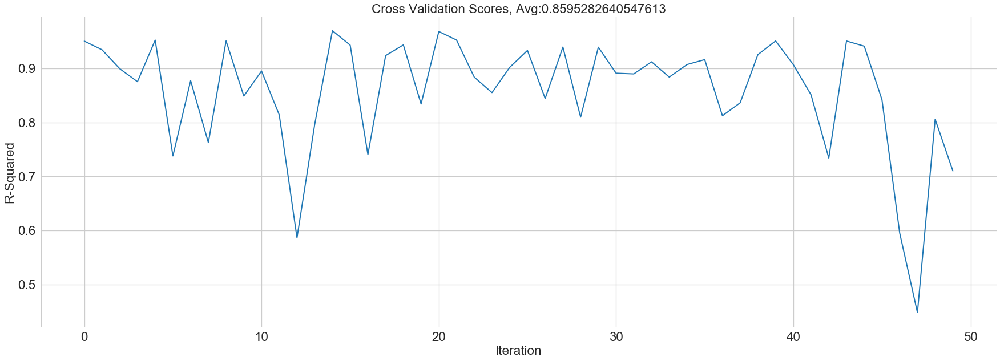

In [196]:
fig, ax = plt.subplots()
ax.plot([i for i in range(len(r2_scores))],r2_scores,lw=2)
ax.set_xlabel('Iteration')
ax.set_ylabel('R-Squared')
ax.title.set_text("Cross Validation Scores, Avg:{}".format(np.average(r2_scores)))
plt.show()

In [295]:
## Decision tree based regression
dtr = DecisionTreeRegressor(max_depth=15)
dtr.fit(train_tree_f,y_train3)

DecisionTreeRegressor(criterion='mse', max_depth=15, max_features=None,
           max_leaf_nodes=None, min_impurity_decrease=0.0,
           min_impurity_split=None, min_samples_leaf=1,
           min_samples_split=2, min_weight_fraction_leaf=0.0,
           presort=False, random_state=None, splitter='best')

In [296]:
dtr.score(train_tree_f,y_train3)

0.9996372972819509

In [297]:
## display the tree
from IPython.display import Image  
dot_data = export_graphviz(dtr, out_file=None, 
                         feature_names=train_tree_f.columns,
                         class_names=y_train3.columns,  
                         filled=True, rounded=True,  
                         special_characters=True)  
graph = pydotplus.graph_from_dot_data(dot_data)  
graph.write_pdf("Houseprice.pdf") 

True

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.585219 to fit



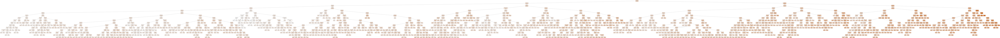

In [299]:
Image(graph.create_png()) 

In [300]:
y_pred = dtr.predict(test_tree_f)

In [301]:
print("MSE::{}".format(mean_squared_error(y_test, y_pred)))

MSE::1963014670.2277808


In [333]:
## Decision tree based regression
dtr = DecisionTreeRegressor(max_depth=6)
dtr.fit(train_tree_f,y_train3)

DecisionTreeRegressor(criterion='mse', max_depth=6, max_features=None,
           max_leaf_nodes=None, min_impurity_decrease=0.0,
           min_impurity_split=None, min_samples_leaf=1,
           min_samples_split=2, min_weight_fraction_leaf=0.0,
           presort=False, random_state=None, splitter='best')

In [334]:
## display the tree
from IPython.display import Image  
dot_data = export_graphviz(dtr, out_file=None, 
                         feature_names=train_tree_f.columns,
                         class_names=y_train3.columns,  
                         filled=True, rounded=True,  
                         special_characters=True)  
graph = pydotplus.graph_from_dot_data(dot_data)  
graph.write_pdf("Houseprice.pdf") 

True

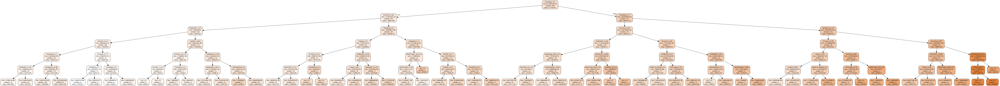

In [338]:
Image(graph.create_png()) 

In [336]:
y_pred = dtr.predict(test_tree_f)

In [337]:
print("MSE::{}".format(mean_squared_error(y_test, y_pred)))

MSE::1642149748.9372263
